In [1]:
import numpy as np 
import pandas as pd 
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from scipy import stats
from imblearn.over_sampling import SMOTE 
from collections import Counter
import warnings

warnings.filterwarnings("ignore")


In [50]:
rain = pd.read_csv('data/weatherAUS.csv')
rain.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [31]:
print(f'The number of rows are {rain.shape[0] } and the number of columns are {rain.shape[1]}')

The number of rows are 145460 and the number of columns are 23


In [32]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

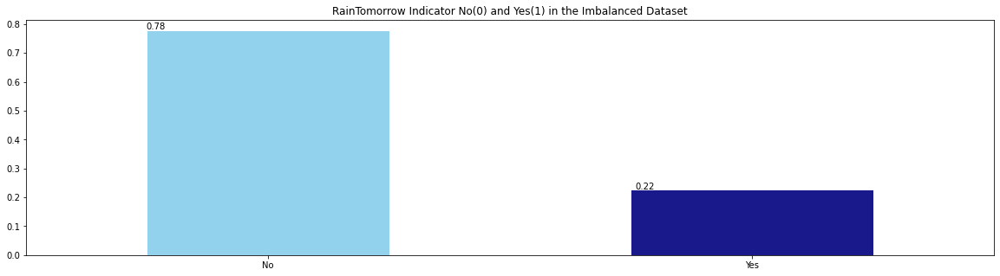

In [33]:
fig = plt.figure(figsize = (20,5))
ax=rain.RainTomorrow.value_counts(normalize = True).plot(kind='bar', color= ['skyblue','navy'], alpha = 0.9, rot=0)
plt.title('RainTomorrow Indicator No(0) and Yes(1) in the Imbalanced Dataset')
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),2)), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.show()

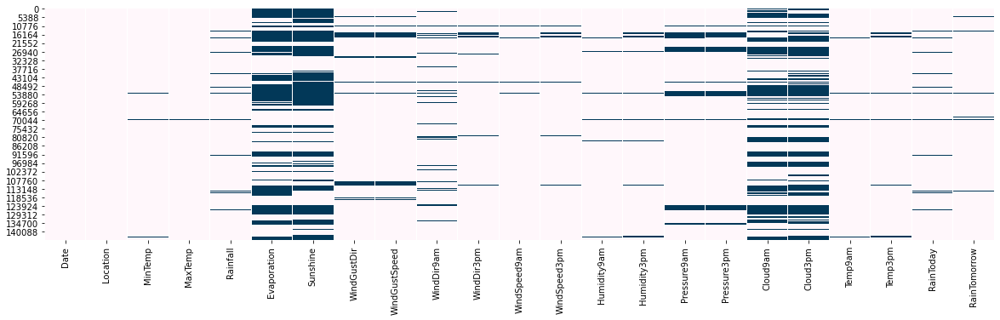

In [34]:
plt.figure(figsize = (20,5))
sns.heatmap(rain.isnull(), cbar=False, cmap='PuBu')
plt.show()

In [35]:
(rain.isnull().sum()/len(rain))*100


Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [36]:
total = rain.isnull().sum().sort_values(ascending=False)
percent = (rain.isnull().sum()/rain.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing.head()

,Total,Percent
Sunshine,69835,0.480098
Evaporation,62790,0.431665
Cloud3pm,59358,0.408071
Cloud9am,55888,0.384216
Pressure9am,15065,0.103568


In [37]:
rain.select_dtypes(include=['object']).columns

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [38]:
import plotly.express as px
px.histogram(rain, x='Location', 
             title='Location vs. Rainy Days', 
             color='RainToday')

Observations:

- We have an approx unifrom distribution of data across location.
- Nhil, Darwin, Uluru reports least rain
- Whatsonia receives most rain among 49 locations.
- Location is **definitely a factor** in deciding whether it will rain tomorrow or not.

In [39]:
px.histogram(rain, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

Observation:

- It is following a decent normal distribution.
- When the temperature is lower, the chances of rain is quite higher.
- Temperature at 3 PM **plays a vital role in predicting** whether it will rain tomorrow or not.

In [40]:
px.histogram(rain, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

Observation:

- We have an class **imbalance case**(we don't have equal number of observations in each class)
- If it didn't rain today, there is a pretty good chance that it will not rain tomorrow. (predicting not rain is easier, than predicting rain for tomorrow)

In [41]:
px.scatter(rain.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

Observation:

- It shows a **linear positive correlation** between minimum temperature and maximum temperature.
- Points at the center is overlapping, indicating if it rains todays, variation in minimum and maximum temperature is low.

In [42]:
px.scatter(rain.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')


Observations:

- If the temperature today is low and humidity is high, it may rain tomorrow.
- If temperature today is high and humidity is low, it may not rain tomorrow

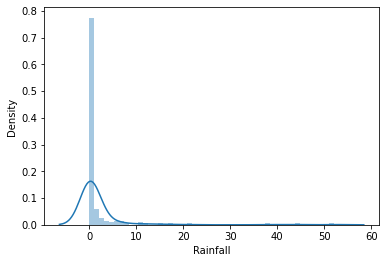

In [43]:
sns.distplot(rain.Rainfall.sample(200));

Observation: It is following a nice gaussian distribution.

In [44]:
px.scatter(rain.sample(2000), 
           title='Pressure (3 pm) vs. Pressure (3 pm)',
           x='Pressure3pm',
           y='Pressure9am',
           color='RainTomorrow')

Observations:

- Pressure at 3PM is in a positive correlation with pressure at 9AM.
- Since most of the points are overlapping, we can say that more pressure at 9AM and 3PM results in no rain tomorrow.

In [45]:
px.scatter(rain.sample(2000), 
           title='Temp (3 pm) vs. Temp (9 am)',
           x='Temp9am',
           y='Temp3pm',
           color='RainTomorrow')

Observations:

- Temperature and humidity at 3PM are **positively correlated**.
- High temperature and humidity results in no rain tomorrow.

In [46]:
px.histogram(rain, 
             x='Cloud3pm', 
             title='Cloud at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

Observations:

- More cloud at 3PM indicates fair chances of raining tomorrow
- Whereas, for no rain, it is quite difficult to decide

In [48]:
px.histogram(rain.sample(100), 
             x='Rainfall', 
             title='Rainfall vs. Rain Tomorrow', 
             color='RainTomorrow')

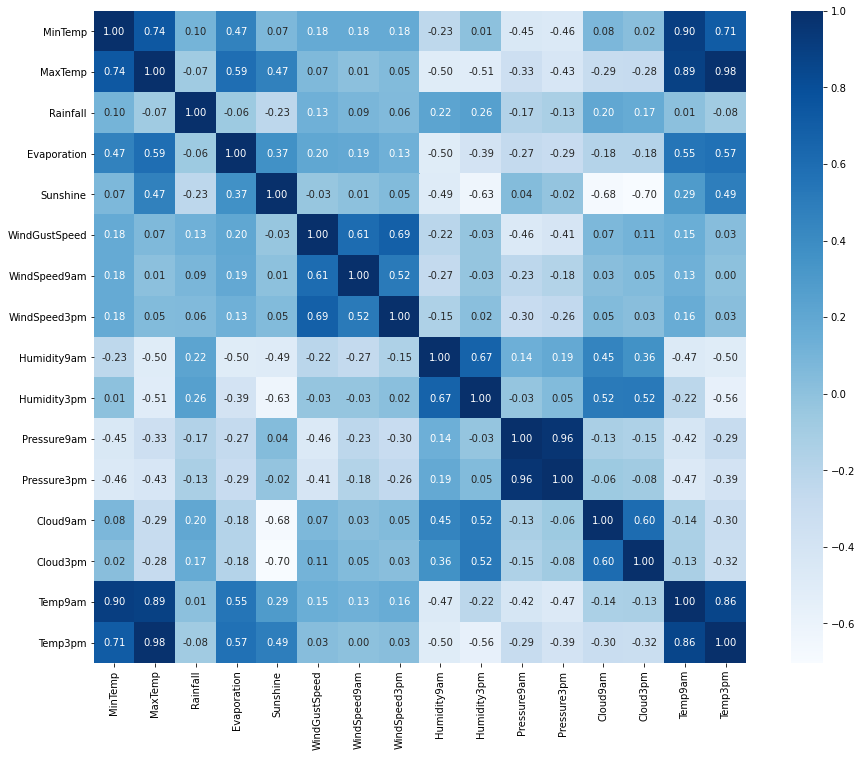

In [49]:
plt.figure(figsize=(16,12))
sns.heatmap(rain.corr(), 
            square=True, 
            cmap='Blues', 
            annot=True, 
            fmt='.2f', 
            linecolor='white');

Highly positive correlation can be found between few variables.